### **Download Dataset**

In [ ]:
import os
from google.colab import files

# Fazer upload do arquivo kaggle.json
files.upload()

# Criar a pasta .kaggle e mover o arquivo para lá
os.makedirs("/root/.kaggle", exist_ok=True)
!mv kaggle.json /root/.kaggle/

# Ajustar permissões
!chmod 600 /root/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json


In [ ]:
# Baixar o dataset
!kaggle datasets download -d tapakah68/yandextoloka-water-meters-dataset

# Extrair o conteúdo do arquivo zip
!unzip yandextoloka-water-meters-dataset.zip -d dataset

# Ver os arquivos extraídos
!ls dataset

Dataset URL: https://www.kaggle.com/datasets/tapakah68/yandextoloka-water-meters-dataset
License(s): Attribution-NonCommercial-NoDerivatives 4.0 International (CC BY-NC-ND 4.0)
 97% 955M/982M [00:04<00:00, 215MB/s]
100% 982M/982M [00:04<00:00, 212MB/s]
Archive:  yandextoloka-water-meters-dataset.zip
  inflating: dataset/WaterMeters/collage/id_1000_value_176_881.jpg  
  inflating: dataset/WaterMeters/collage/id_1001_value_1113_124.jpg  
  inflating: dataset/WaterMeters/collage/id_1002_value_105_174.jpg  
  inflating: dataset/WaterMeters/collage/id_1003_value_209_317.jpg  
  inflating: dataset/WaterMeters/collage/id_1004_value_37_176.jpg  
  inflating: dataset/WaterMeters/collage/id_1005_value_273_47.jpg  
  inflating: dataset/WaterMeters/collage/id_1006_value_66_009.jpg  
  inflating: dataset/WaterMeters/collage/id_1007_value_60_219.jpg  
  inflating: dataset/WaterMeters/collage/id_1008_value_95_912.jpg  
  inflating: dataset/WaterMeters/collage/id_1009_value_133_679.jpg  
  inflating: 

### **Retirando coordenada do relogio e valor de cada relogio**

In [ ]:
import cv2
import os
import re
import matplotlib.pyplot as plt
import numpy as np
import glob


def extrair_bounding_box(mascara_path):
    """
    Encontra a bounding box da região branca (valor 255) da máscara binária,
    mesmo para áreas inclinadas.
    """
    # Ler a máscara em escala de cinza
    mascara = cv2.imread(mascara_path, cv2.IMREAD_GRAYSCALE)

    # Garantir que a máscara seja binarizada (preto e branco)
    _, mascara_bin = cv2.threshold(mascara, 127, 255, cv2.THRESH_BINARY)

    # Encontrar as coordenadas da região branca (onde o valor é 255)
    posicoes_brancas = cv2.findNonZero(mascara_bin)

    if posicoes_brancas is None:
        return None

    # Obter o retângulo mínimo que envolve a região branca, mesmo se inclinada
    rotulado = cv2.minAreaRect(posicoes_brancas)  # Retângulo rotacionado
    caixa = cv2.boxPoints(rotulado)  # Coordenadas dos quatro pontos da caixa
    caixa = np.int32(caixa)  # Converter para inteiros usando numpy

    # Extrair o nome da imagem a partir do caminho
    nome_imagem = os.path.basename(mascara_path).replace("_mask", "")
    valor_relogio = extrair_valor_do_nome(nome_imagem)

    return {"imagem": nome_imagem, "bounding_box": caixa, "valor_relogio": valor_relogio}

def extrair_valor_do_nome(nome_imagem):
    """
    Extrai o valor do relógio do nome da imagem usando regex.
    """
    match = re.search(r"value_([\d_]+)", nome_imagem)
    if match:
        valor_str = match.group(1).replace("_", ".")
        return float(valor_str)
    return None

# Pasta contendo as imagens e máscaras
dataset_path = "/content/dataset/WaterMeters"
images_path = os.path.join(dataset_path, "images")
masks_path = os.path.join(dataset_path, "masks")

# Listar todas as máscaras
mask_files = glob.glob(os.path.join(masks_path, "*.jpg"))

dados = []
for mask_path in mask_files:
    info = extrair_bounding_box(mask_path)
    if info:
        dados.append(info)

# Exibir algumas amostras extraídas
for i in range(min(1244, len(dados))):
    print(dados[i])

{'imagem': 'id_941_value_37_11.jpg', 'bounding_box': array([[332, 542],
       [333, 497],
       [644, 502],
       [643, 547]], dtype=int32), 'valor_relogio': 37.11}
{'imagem': 'id_1039_value_643_825.jpg', 'bounding_box': array([[192, 545],
       [195, 493],
       [493, 513],
       [489, 565]], dtype=int32), 'valor_relogio': 643.825}
{'imagem': 'id_167_value_2_299.jpg', 'bounding_box': array([[220, 762],
       [243, 656],
       [772, 771],
       [749, 877]], dtype=int32), 'valor_relogio': 2.299}
{'imagem': 'id_1038_value_163_397.jpg', 'bounding_box': array([[ 431,  974],
       [ 639,  681],
       [ 684,  713],
       [ 476, 1006]], dtype=int32), 'valor_relogio': 163.397}
{'imagem': 'id_943_value_99_677.jpg', 'bounding_box': array([[193, 429],
       [814, 401],
       [820, 513],
       [198, 541]], dtype=int32), 'valor_relogio': 99.677}
{'imagem': 'id_964_value_487_767.jpg', 'bounding_box': array([[208, 424],
       [581, 424],
       [581, 493],
       [208, 493]], dtype=in

### **Testando coordenadas e valor do relogio**

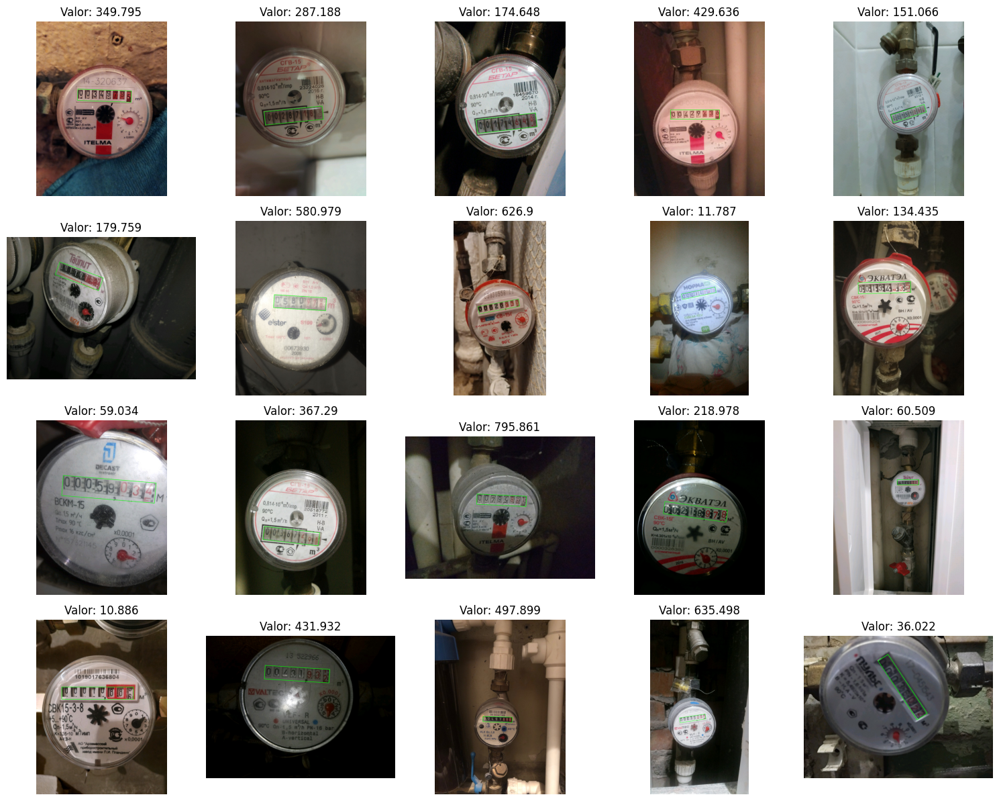

In [ ]:
import cv2
import os
import glob
import random
import matplotlib.pyplot as plt
import numpy as np

def plotar_bounding_boxes(imagens_path, dados, n_imagens=10):
    """
    Plota imagens com suas respectivas bounding boxes.

    :param imagens_path: Caminho para a pasta com as imagens.
    :param dados: Lista com as informações das bounding boxes extraídas.
    :param n_imagens: Número de imagens a serem plotadas.
    """
    # Selecionar imagens aleatórias
    imagens_selecionadas = random.sample(dados, n_imagens)

    plt.figure(figsize=(15, 15))

    for i, info in enumerate(imagens_selecionadas):
        imagem_path = os.path.join(imagens_path, info["imagem"])
        imagem = cv2.imread(imagem_path)
        imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)  # Converter para RGB para exibir corretamente com matplotlib

        # Desenhar a bounding box rotacionada na imagem
        caixa = info["bounding_box"]
        if len(caixa) == 4:  # Garantir que temos 4 pontos para a caixa rotacionada
            caixa = caixa.reshape((-1, 1, 2))  # Redimensionar para o formato correto para cv2.polylines
            cv2.polylines(imagem, [caixa], isClosed=True, color=(0, 255, 0), thickness=2)

        # Exibir a imagem com a bounding box rotacionada
        plt.subplot(5, 5, i + 1)  # Organizar as imagens em uma grade
        plt.imshow(imagem)
        plt.title(f"Valor: {info['valor_relogio']}")
        plt.axis('off')  # Esconder os eixos

    plt.tight_layout()
    plt.show()

# Caminho para as imagens
dataset_path = "/content/dataset/WaterMeters"
imagens_path = os.path.join(dataset_path, "images")

# Plotar 20 imagens com as respectivas bounding boxes
plotar_bounding_boxes(imagens_path, dados, n_imagens=20)


### **Salvar as imagens em uma lista e salvar as labels em lista**

In [ ]:
import cv2
import numpy as np
import os


images_x = []
valores_y = []

def preprocess_image_with_coords(img_name, bounding_box, image_size=(224,64)):
    """
    Carrega a imagem, recorta a região de interesse (ROI) com base nas coordenadas,
    redimensiona, normaliza a imagem e aplica padding se necessário.
    """
    # Caminho completo da imagem
    img_path = os.path.join(images_path, img_name)

    # Carregar a imagem
    img = cv2.imread(img_path)

    if img is None:
        print(f"Erro ao carregar a imagem: {img_name}")
        return None

    # Coordenadas da bounding box (não será alterado)
    # Verifica se a bounding box é rotacionada (tem 4 pontos)
    if len(bounding_box) == 4:
        return preprocess_rotated_image(img, bounding_box, image_size)
    else:
        x, y, w, h = bounding_box
        return preprocess_non_rotated_image(img, (x, y, w, h), image_size)

def preprocess_rotated_image(img, bounding_box, image_size=(224, 64)):
    """
    Gira a imagem no sentido horário para alinhar a bounding box rotacionada,
    garantindo que o lado mais longo fique na horizontal e que a imagem não fique de cabeça pra baixo.
    """
    caixa = np.array(bounding_box, dtype="float32")

    # Obter o retângulo rotacionado
    rect = cv2.minAreaRect(caixa)
    center, size, angle = rect

    width, height = size

    # Garantir que o lado maior (largura) fique na horizontal
    if width < height:
        angle -= 90  # sentido horário (positivo gira anti-horário, então negativo gira horário)

    # Matriz de rotação no sentido horário
    (h, w) = img.shape[:2]
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    img_rotated = cv2.warpAffine(img, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)

    # Aplicar mesma rotação nos pontos da caixa
    caixa_rotacionada = cv2.transform(np.array([caixa]), M)[0]

    # Obter a nova bounding box alinhada com os eixos
    x, y, w_box, h_box = cv2.boundingRect(caixa_rotacionada.astype(int))
    roi = img_rotated[y:y+h_box, x:x+w_box]

    # Corrigir se a imagem estiver de cabeça pra baixo
    if roi.shape[0] > roi.shape[1]:  # altura maior que largura, está "em pé" ainda
        roi = cv2.rotate(roi, cv2.ROTATE_180)

    # Redimensionar a ROI
    roi_resized = cv2.resize(roi, image_size)

    return roi_resized


# Iterar pelos dados existentes (dados já extraídos, com as bounding boxes e valores)
for info in dados:
    img_name = info["imagem"]
    bounding_box = info["bounding_box"]
    value = info["valor_relogio"]

    # Processar a imagem (recortar ROI, redimensionar e normalizar)
    roi = preprocess_image_with_coords(img_name, bounding_box)



    if roi is not None:
        # Aqui você pode alimentar o modelo diretamente, sem criar um novo dataset
        # A variável `roi` já é a imagem processada que será usada para o treinamento

        # Exemplo de alimentação para o modelo (caso esteja usando algo como fit() no modelo Keras)
        # model.fit(roi, value)

        # Ou armazenar as imagens e valores em listas para posterior uso no modelo
        images_x.append(roi)  # Apenas se for necessário armazenar para posterior uso
        # Formatar o valor com 3 casas decimais e completar com zeros à esquerda até 8 caracteres
        valor_formatado = f"{value:09.3f}".replace('.', '')  # Remove o ponto decimal
        valores_y.append(valor_formatado)# Rótulo correspondente à imagem (valor do relógio)
        #y_train.append(value)
    else:
        print(f"Erro ao processar a imagem {img_name}")


In [ ]:
print(valores_y)

['00037110', '00643825', '00002299', '00163397', '00099677', '00487767', '00276273', '00208354', '00067521', '00139457', '00314492', '00442512', '00273470', '00219630', '00619000', '00295293', '00138490', '00156423', '00146443', '00251163', '01050584', '00468840', '00096483', '00254081', '00092258', '00209317', '00108331', '00730384', '00049186', '00041828', '00177586', '00056516', '00219494', '00057097', '00886577', '00561627', '02115472', '00139462', '00414676', '00257129', '00026999', '00079867', '00333944', '00109499', '00061941', '00233116', '00010955', '00008898', '00071007', '00028306', '00493084', '00308371', '00222914', '00153434', '00854361', '00362368', '00215105', '00330374', '00203248', '00073816', '00097817', '00001747', '00115182', '00021789', '00492481', '00276903', '00109805', '00748000', '01669853', '00033894', '00665000', '00419123', '00971394', '00084705', '00112622', '00008348', '00176263', '00674017', '00425980', '00321827', '00493122', '00779907', '00169244', '00

In [ ]:
print(images_x)

[array([[[129, 137, 141],
        [136, 145, 149],
        [139, 148, 152],
        ...,
        [135, 145, 155],
        [132, 142, 152],
        [136, 145, 155]],

       [[126, 135, 139],
        [131, 140, 143],
        [134, 143, 147],
        ...,
        [123, 132, 142],
        [120, 130, 140],
        [129, 139, 149]],

       [[122, 131, 135],
        [116, 125, 129],
        [117, 126, 130],
        ...,
        [107, 117, 127],
        [106, 117, 127],
        [123, 133, 143]],

       ...,

       [[153, 159, 164],
        [151, 157, 162],
        [ 99, 105, 110],
        ...,
        [178, 184, 195],
        [189, 196, 204],
        [202, 207, 215]],

       [[155, 162, 167],
        [158, 164, 169],
        [106, 112, 117],
        ...,
        [179, 186, 195],
        [187, 194, 202],
        [203, 209, 216]],

       [[157, 164, 168],
        [162, 168, 173],
        [116, 121, 126],
        ...,
        [184, 191, 199],
        [189, 196, 204],
        [205, 212, 219]

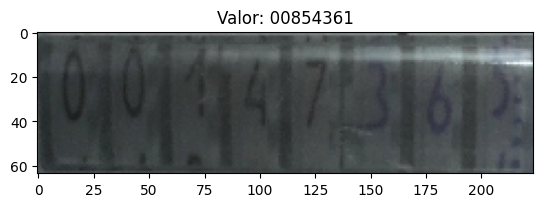

In [ ]:
import matplotlib.pyplot as plt

plt.imshow(images_x[1003])  # Visualizar a primeira imagem
plt.title(f"Valor: {valores_y[54]}")  # Mostrar o valor correspondente
plt.show()


In [ ]:
import matplotlib.pyplot as plt

# Configurações
colunas = 5
tamanho_figura = (15, 3)  # largura, altura por linha (você pode ajustar)

# Loop em blocos de 5
for i in range(0, len(images_x), colunas):
    imagens_linha = images_x[i:i+colunas]
    plt.figure(figsize=tamanho_figura)

    for j, img in enumerate(imagens_linha):
        plt.subplot(1, colunas, j+1)
        plt.imshow(img)
        plt.title(f'Índice: {i+j}')
        plt.axis('off')

    plt.tight_layout()
    plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Lista completa de índices das imagens que você quer inverter
indices_para_inverter = [3, 44, 91, 121, 123, 151, 175, 193, 201, 213, 230, 260, 273, 280, 283, 310, 338, 358, 371, 380, 389, 416, 437, 474, 510, 530, 553, 669, 691, 741, 751, 757, 818,
820, 825, 853, 862, 881, 940, 954, 981, 1023, 1040, 1074, 1100, 1140, 1146, 1201

]

# Garante que os índices estejam dentro do tamanho da lista
indices_para_inverter = [i for i in indices_para_inverter if i < len(images_x)]

# Cria subplots dinamicamente
fig, axes = plt.subplots(len(indices_para_inverter), 2, figsize=(8, 4 * len(indices_para_inverter)))

# Caso só haja uma imagem, ajusta a forma dos eixos
if len(indices_para_inverter) == 1:
    axes = np.expand_dims(axes, axis=0)

# Processa e plota todas as imagens
for idx, i in enumerate(indices_para_inverter):
    imagem_original = images_x[i].copy()
    images_x[i] = np.rot90(images_x[i], 2)  # Rotaciona 180°
    imagem_invertida = images_x[i]

    # Exibe imagem original
    axes[idx, 0].imshow(imagem_original)
    axes[idx, 0].set_title(f"Original (índice {i})")
    axes[idx, 0].axis('off')

    # Exibe imagem invertida
    axes[idx, 1].imshow(imagem_invertida)
    axes[idx, 1].set_title(f"Invertida (índice {i})")
    axes[idx, 1].axis('off')

plt.tight_layout()
plt.show()


In [ ]:
import matplotlib.pyplot as plt

# Índices das imagens/labels a serem removidos
indices_para_remover = [14, 67, 70, 148, 171, 182, 196, 286, 384, 403, 422, 443, 468, 479, 482, 542, 596, 683, 806, 814, 861, 895, 934, 965, 977, 978, 988, 1008, 1024, 1062, 1095, 1096,
1098, 1195, 1196, 1209]

# Filtra e ordena os índices em ordem decrescente para remoção segura
indices_para_remover = sorted(set(i for i in indices_para_remover if i < len(images_x)), reverse=True)

# Para cada índice, plota a imagem e remove depois
for i in indices_para_remover:
    plt.imshow(images_x[i])
    plt.title(f"Índice {i} | Label: {valores_y[i]}")
    plt.axis('off')
    plt.show()

    # Remoção da imagem e label
    del images_x[i]
    del valores_y[i]

print("Imagens e labels nos índices especificados foram exibidos e removidos com sucesso.")


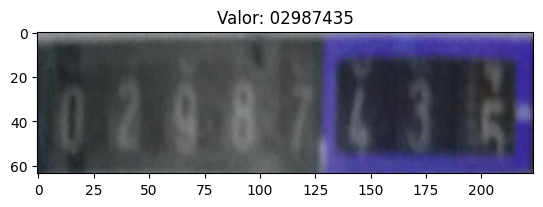

In [ ]:
import matplotlib.pyplot as plt

plt.imshow(images_x[417])  # Visualizar a primeira imagem
plt.title(f"Valor: {valores_y[417]}")  # Mostrar o valor correspondente
plt.show()


In [ ]:
print(len(images_x))
print(len(valores_y))

1208
1208


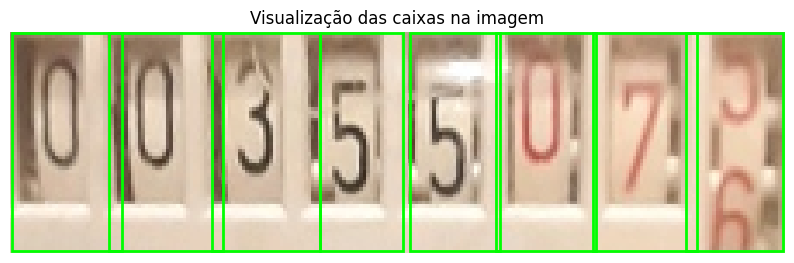

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Novas caixas no formato (x_inicio, x_fim, y_inicio, y_fim)
caixas = [
    (0, 32, 0, 63),
    (28, 61, 0, 63),
    (58, 89, 0, 63),
    (89, 113, 0, 63),
    (115, 141, 0, 63),
    (140, 169, 0, 63),
    (168, 198, 0, 63),
    (195, 223, 0, 63),
]

# Listas para armazenar os resultados
imagens_recortadas = []
labels_recortadas = []

# Loop principal
for idx_img, img_bgr in enumerate(images_x):
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

    label = str(valores_y[idx_img])  # Garante string com 8 dígitos

    for idx_box, (x_ini, x_fim, y_ini, y_fim) in enumerate(caixas):
        # Recorta a ROI
        roi = img_rgb[y_ini:y_fim, x_ini:x_fim]

        # Redimensiona para 32x32
        roi_resized = cv2.resize(roi, (28, 28), interpolation=cv2.INTER_AREA)

        # Adiciona à lista
        imagens_recortadas.append(roi_resized)
        labels_recortadas.append(label[idx_box])

# Plotar uma imagem com as caixas para ver se está certo
idx_teste = 705  # Índice da imagem a ser visualizada
img_rgb = cv2.cvtColor(images_x[idx_teste], cv2.COLOR_BGR2RGB)
fig, ax = plt.subplots(figsize=(10, 4))
ax.imshow(img_rgb)

for (x_ini, x_fim, y_ini, y_fim) in caixas:
    largura = x_fim - x_ini
    altura = y_fim - y_ini
    rect = plt.Rectangle((x_ini, y_ini), largura, altura, edgecolor='lime', facecolor='none', linewidth=2)
    ax.add_patch(rect)

plt.title("Visualização das caixas na imagem")
plt.axis('off')
plt.show()


In [ ]:
print(len(imagens_recortadas))
print(len(labels_recortadas))

9664
9664


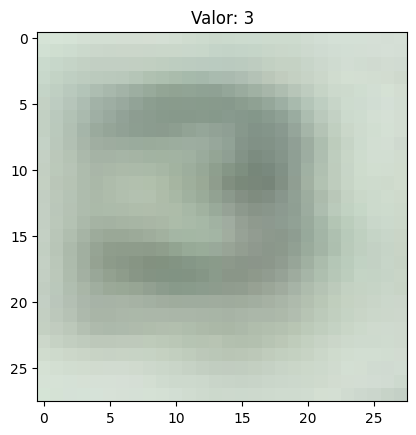

In [ ]:
plt.imshow(imagens_recortadas[100])  # Visualizar a primeira imagem
plt.title(f"Valor: {labels_recortadas[100]}")  # Mostrar o valor correspondente
plt.show()


In [ ]:
import zipfile
import os

zip_path = "/content/digit_crops_filtered.zip"  # nome do arquivo zip que você fez upload

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall("/content/images")


In [ ]:
import os
from PIL import Image
import numpy as np
import re

# Caminho da pasta com as imagens
images_path = '/content/images'
labels_path = '/content/digit_labels_filtered.txt'

# Função para extrair número do nome do arquivo
def extract_number(filename):
    numbers = re.findall(r'\d+', filename)
    return int(numbers[0]) if numbers else -1

# Lista ordenada numericamente
image_files = sorted(
    [f for f in os.listdir(images_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))],
    key=extract_number
)

# Lê as labels
with open(labels_path, 'r') as f:
    labels_new = [int(line.strip()) for line in f.readlines()]

# Verifica correspondência
assert len(image_files) == len(labels_new), "Número de imagens e labels não confere!"

# Carrega imagens
imagens_new = []
for img_name in image_files:
    img_path = os.path.join(images_path, img_name)
    img = Image.open(img_path).convert('RGB')
    img_array = np.array(img)
    imagens_new.append(img_array)

print(f'Total de imagens carregadas: {len(imagens_new)}')
print(f'Tamanho da primeira imagem: {imagens_new[0].shape}')
print(f'Primeiros labels: {labels_new[:10]}')


Total de imagens carregadas: 7818
Tamanho da primeira imagem: (28, 28, 3)
Primeiros labels: [0, 0, 8, 5, 0, 1, 3, 5, 0, 1]


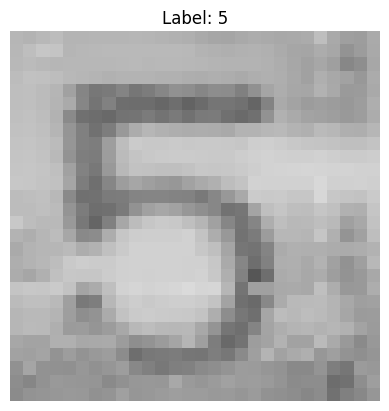

In [ ]:
import matplotlib.pyplot as plt

# Exibe a primeira imagem e seu label
plt.imshow(imagens_new[7])
plt.title(f'Label: {labels_new[7]}')
plt.axis('off')
plt.show()


In [ ]:
# Junta as listas de imagens
imagens_recortadas = imagens_new + imagens_recortadas

# Junta as listas de labels
labels_recortadas = labels_new + labels_recortadas


In [ ]:
print(len(imagens_recortadas))
print(len(labels_recortadas))

17482
17482


In [ ]:
from collections import Counter

# Converte para inteiros
labels_int = [int(label) for label in labels_recortadas]

# Conta os dígitos
contagem = Counter(labels_int)

# Exibe o resultado
for i in range(10):
    print(f"Dígito {i}: {contagem.get(i, 0)} ocorrências")


Dígito 0: 5288 ocorrências
Dígito 1: 2172 ocorrências
Dígito 2: 1465 ocorrências
Dígito 3: 1441 ocorrências
Dígito 4: 1220 ocorrências
Dígito 5: 1291 ocorrências
Dígito 6: 1244 ocorrências
Dígito 7: 1125 ocorrências
Dígito 8: 1206 ocorrências
Dígito 9: 1030 ocorrências


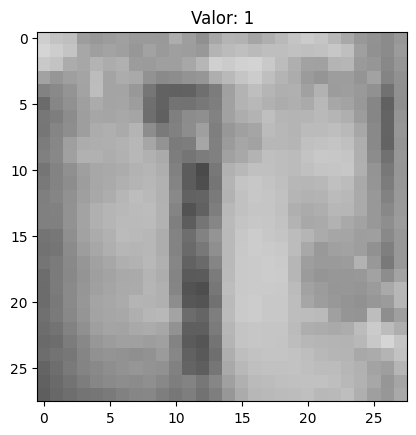

In [ ]:
plt.imshow(imagens_recortadas[1547])  # Visualizar a primeira imagem
plt.title(f"Valor: {labels_recortadas[1547]}")  # Mostrar o valor correspondente
plt.show()


In [ ]:
from collections import defaultdict, Counter
from sklearn.utils import shuffle
import numpy as np

# Conversão de rótulos para inteiros
labels_int = [int(label) for label in labels_recortadas]

# Agrupar imagens por classe
classe_para_imgs = defaultdict(list)
for img, label in zip(imagens_recortadas, labels_int):
    classe_para_imgs[label].append(img)

# Parâmetros
num_test_por_classe = 150
prop_train = 0.7  # do conjunto restante após teste

# Inicializar conjuntos
X_train, y_train = [], []
X_val, y_val = [], []
X_test, y_test = [], []

np.random.seed(42)

# Separar 150 imagens por classe para teste
classe_para_resto = {}
for classe, imgs in classe_para_imgs.items():
    imgs = np.array(imgs)
    np.random.shuffle(imgs)

    test_imgs = imgs[:num_test_por_classe]
    resto_imgs = imgs[num_test_por_classe:]  # restante para treino/validação

    X_test.extend(test_imgs)
    y_test.extend([classe] * len(test_imgs))

    classe_para_resto[classe] = resto_imgs

# Balancear o restante para treino/validação (undersampling)
min_restante = min(len(imgs) for imgs in classe_para_resto.values())

for classe, imgs in classe_para_resto.items():
    imgs = np.array(imgs)
    np.random.shuffle(imgs)

    imgs_bal = imgs[:min_restante]

    n_train = int(min_restante * prop_train)
    n_val = min_restante - n_train

    train_imgs = imgs_bal[:n_train]
    val_imgs = imgs_bal[n_train:]

    X_train.extend(train_imgs)
    y_train.extend([classe] * len(train_imgs))

    X_val.extend(val_imgs)
    y_val.extend([classe] * len(val_imgs))

# Embaralhar conjuntos finais
X_train_final, y_train_final = shuffle(X_train, y_train, random_state=42)
X_val_final, y_val_final = shuffle(X_val, y_val, random_state=42)
X_test_final, y_test_final = shuffle(X_test, y_test, random_state=42)

# Relatório final
print(f"Treino:     {len(X_train_final)} imagens")
print(f"Validação:  {len(X_val_final)} imagens")
print(f"Teste:      {len(X_test_final)} imagens")

print("\nDistribuição por classe:")
print("Treino:    ", Counter(y_train_final))
print("Validação: ", Counter(y_val_final))
print("Teste:     ", Counter(y_test_final))


Treino:     6160 imagens
Validação:  2640 imagens
Teste:      1500 imagens

Distribuição por classe:
Treino:     Counter({6: 616, 0: 616, 5: 616, 2: 616, 4: 616, 1: 616, 7: 616, 3: 616, 8: 616, 9: 616})
Validação:  Counter({2: 264, 0: 264, 1: 264, 6: 264, 8: 264, 3: 264, 9: 264, 4: 264, 7: 264, 5: 264})
Teste:      Counter({2: 150, 4: 150, 5: 150, 1: 150, 6: 150, 3: 150, 7: 150, 8: 150, 0: 150, 9: 150})


In [ ]:
# from collections import defaultdict, Counter
# from sklearn.model_selection import train_test_split
# from sklearn.utils import shuffle
# import numpy as np

# # labels_recortadas e imagens_recortadas já estão carregadas
# labels_int = [int(label) for label in labels_recortadas]

# # Organiza imagens por classe
# classe_para_imgs = defaultdict(list)
# for img, label in zip(imagens_recortadas, labels_int):
#     classe_para_imgs[label].append(img)

# X_train, y_train = [], []
# X_restante, y_restante = [], []

# # Seleciona até 1000 por classe para treino, o resto vai para "restante"
# for classe in sorted(classe_para_imgs.keys()):
#     imagens_classe = classe_para_imgs[classe]
#     np.random.seed(42)
#     np.random.shuffle(imagens_classe)

#     imagens_treino = imagens_classe[:1000]
#     imagens_restante = imagens_classe[1000:]  # pode estar vazio se tiver <= 1000

#     X_train.extend(imagens_treino)
#     y_train.extend([classe] * len(imagens_treino))

#     X_restante.extend(imagens_restante)
#     y_restante.extend([classe] * len(imagens_restante))

# # Divide o restante em validação e teste (200 imagens para teste, estratificado)
# X_val, X_test, y_val, y_test = train_test_split(
#     X_restante, y_restante, test_size=200, random_state=42, stratify=y_restante
# )

# # Embaralha os conjuntos finais (opcional)
# X_train_final, y_train_final = shuffle(X_train, y_train, random_state=42)
# X_val_final, y_val_final = shuffle(X_val, y_val, random_state=42)
# X_test_final, y_test_final = shuffle(X_test, y_test, random_state=42)

# # Tamanhos finais
# print(f"Treino:     {len(X_train_final)} imagens")
# print(f"Validação:  {len(X_val_final)} imagens")
# print(f"Teste:      {len(X_test_final)} imagens")

# # Distribuição por classe
# print("\nDistribuição por classe:")
# print("Treino:    ", Counter(y_train_final))
# print("Validação: ", Counter(y_val_final))
# print("Teste:     ", Counter(y_test_final))


Treino:     10000 imagens
Validação:  7282 imagens
Teste:      200 imagens

Distribuição por classe:
Treino:     Counter({6: 1000, 4: 1000, 1: 1000, 0: 1000, 5: 1000, 2: 1000, 7: 1000, 3: 1000, 9: 1000, 8: 1000})
Validação:  Counter({0: 4173, 1: 1141, 2: 453, 3: 429, 5: 283, 6: 237, 4: 214, 8: 201, 7: 122, 9: 29})
Teste:      Counter({0: 115, 1: 31, 3: 12, 2: 12, 5: 8, 6: 7, 4: 6, 8: 5, 7: 3, 9: 1})


In [ ]:
print(labels_recortadas)

[0, 0, 8, 5, 0, 1, 3, 5, 0, 1, 0, 0, 1, 6, 1, 0, 1, 3, 6, 0, 1, 6, 0, 0, 0, 8, 9, 0, 0, 8, 5, 0, 1, 6, 0, 0, 8, 0, 0, 1, 1, 1, 0, 0, 8, 6, 0, 1, 2, 2, 0, 1, 1, 0, 1, 6, 1, 0, 0, 7, 2, 0, 0, 0, 0, 0, 0, 8, 1, 0, 1, 0, 0, 1, 0, 8, 0, 0, 8, 0, 1, 8, 5, 0, 0, 8, 4, 0, 1, 5, 3, 0, 1, 2, 9, 0, 1, 8, 6, 0, 1, 8, 3, 0, 1, 8, 5, 0, 1, 0, 3, 0, 0, 7, 4, 0, 1, 2, 6, 0, 0, 9, 0, 0, 1, 0, 9, 0, 0, 9, 5, 0, 1, 3, 3, 0, 0, 8, 6, 0, 1, 2, 9, 0, 0, 7, 5, 0, 0, 8, 0, 0, 0, 8, 5, 0, 1, 0, 0, 0, 1, 2, 8, 0, 1, 0, 6, 0, 0, 0, 2, 0, 0, 7, 2, 0, 0, 8, 9, 0, 1, 0, 0, 0, 0, 9, 6, 0, 1, 1, 0, 1, 8, 6, 0, 1, 0, 6, 0, 1, 3, 6, 0, 0, 7, 2, 0, 1, 2, 6, 0, 1, 3, 3, 0, 1, 5, 6, 0, 1, 8, 1, 0, 1, 2, 6, 0, 1, 3, 2, 0, 0, 7, 7, 0, 1, 2, 4, 0, 1, 3, 6, 0, 1, 2, 0, 1, 1, 0, 1, 8, 6, 0, 0, 0, 0, 0, 1, 2, 7, 0, 1, 1, 1, 0, 0, 8, 2, 0, 1, 5, 7, 0, 1, 5, 2, 0, 1, 3, 0, 0, 1, 9, 1, 0, 1, 5, 6, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 8, 0, 1, 2, 4, 0, 1, 2, 8, 0, 1, 1, 4, 0, 1, 5, 7, 0, 1, 2, 9, 0, 1, 2, 1, 0, 0, 9, 6, 0, 1, 0, 8, 0, 

In [ ]:
# from sklearn.model_selection import train_test_split

# # Primeiro, dividir entre treino (aproximadamente 80%) e teste (exatamente 200 imagens)
# X_temp, X_test, y_temp, y_test = train_test_split(
#     imagens_recortadas, labels_recortadas, test_size=200 / len(imagens_recortadas), random_state=42)

# # Agora dividir os dados restantes entre treino (aproximadamente 85%) e validação (aproximadamente 15%)
# X_train, X_val, y_train, y_val = train_test_split(
#     X_temp, y_temp, test_size=0.15, random_state=42)  # 15% do conjunto restante para validação

# # Verificando os tamanhos:
# print("Treino:", len(X_train))
# print("Validação:", len(X_val))
# print("Teste:", len(X_test))
# print("\nvalores de y:")
# print("Treino:", len(y_train))
# print("Validação:", len(y_val))
# print("Teste:", len(y_test))


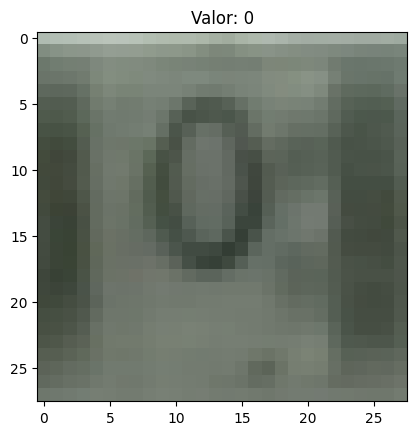

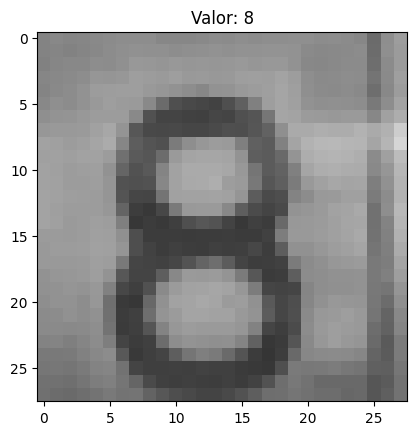

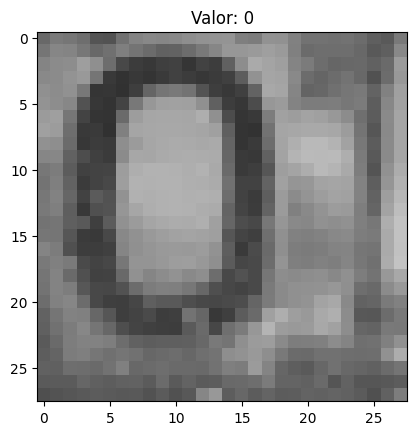

In [ ]:
import matplotlib.pyplot as plt

id = 199

plt.imshow(X_train[id])  # Visualizar a primeira imagem
plt.title(f"Valor: {y_train[id]}")  # Mostrar o valor correspondente
plt.show()

plt.imshow(X_test[id])  # Visualizar a primeira imagem
plt.title(f"Valor: {y_test[id]}")  # Mostrar o valor correspondente
plt.show()


plt.imshow(X_val[id])  # Visualizar a primeira imagem
plt.title(f"Valor: {y_val[id]}")  # Mostrar o valor correspondente
plt.show()


In [ ]:
def rgb2gray(images):
    """Convert images from rbg to grayscale
    """
    greyscale = np.dot(images, [0.2989, 0.5870, 0.1140])
    return np.expand_dims(greyscale, axis=3)


# Transform the images to greyscale
X_train = rgb2gray(X_train).astype(np.float32)
X_test = rgb2gray(X_test).astype(np.float32)
X_val = rgb2gray(X_val).astype(np.float32)

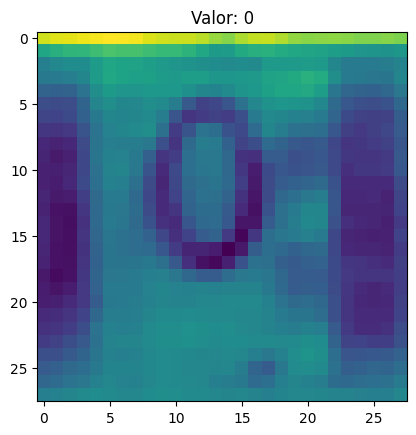

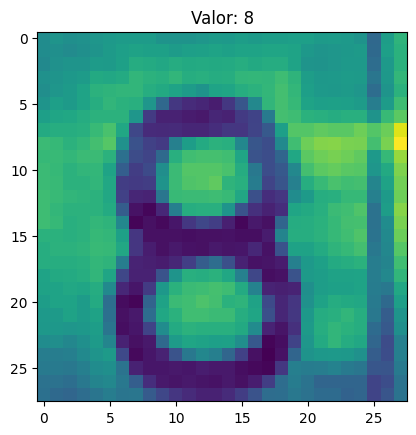

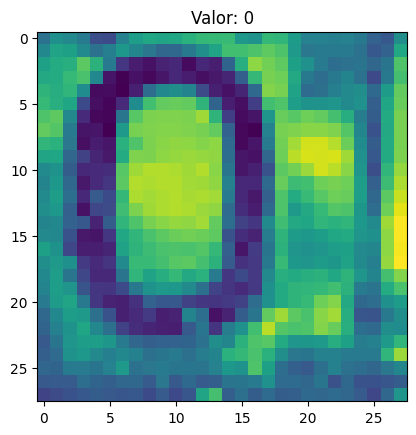

In [ ]:
import matplotlib.pyplot as plt

id = 199

plt.imshow(X_train[id])  # Visualizar a primeira imagem
plt.title(f"Valor: {y_train[id]}")  # Mostrar o valor correspondente
plt.show()

plt.imshow(X_test[id])  # Visualizar a primeira imagem
plt.title(f"Valor: {y_test[id]}")  # Mostrar o valor correspondente
plt.show()


plt.imshow(X_val[id])  # Visualizar a primeira imagem
plt.title(f"Valor: {y_val[id]}")  # Mostrar o valor correspondente
plt.show()


In [ ]:
X_train = X_train.astype("float32") / 255
X_test = X_test.astype("float32") / 255
X_val = X_val.astype("float32") / 255


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
datagen = ImageDataGenerator(
    shear_range=0.05,            # Menos cisalhamento
    rotation_range=5,            # Rotação até 5 graus
    zoom_range=0.1,              # Zoom até 10%
    width_shift_range=0.05,      # Deslocamento até 5%
    height_shift_range=0.05,
    horizontal_flip=False,
    vertical_flip=False,
    fill_mode='nearest'
)


In [ ]:
# Converter de string para inteiro para treino, validação e teste
from tensorflow.keras.utils import to_categorical
y_train = np.array(y_train, dtype=int)
y_val = np.array(y_val, dtype=int)
y_test = np.array(y_test, dtype=int)

# Aplicando o one-hot encoding para treino, validação e teste
y_train = to_categorical(y_train, num_classes=10)
y_val = to_categorical(y_val, num_classes=10)
y_test = to_categorical(y_test, num_classes=10)

# Exibindo os resultados
print("Primeiro rótulo de treino one-hot:", y_train[0])
print("Primeiro rótulo de validação one-hot:", y_val[0])
print("Primeiro rótulo de teste one-hot:", y_test[0])


Primeiro rótulo de treino one-hot: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Primeiro rótulo de validação one-hot: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Primeiro rótulo de teste one-hot: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


In [ ]:

# Verificando o formato das imagens e rótulos
print("Formato de X_train:", X_train.shape)
print("Formato de y_train:", y_train.shape)

Formato de X_train: (6160, 28, 28, 1)
Formato de y_train: (6160, 10)


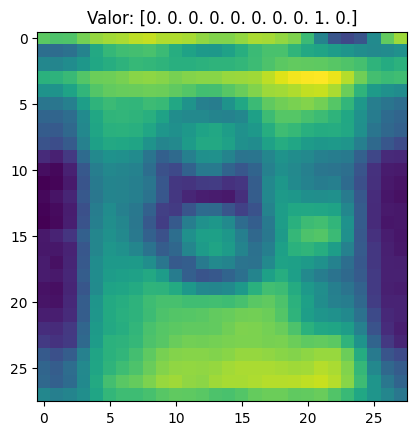

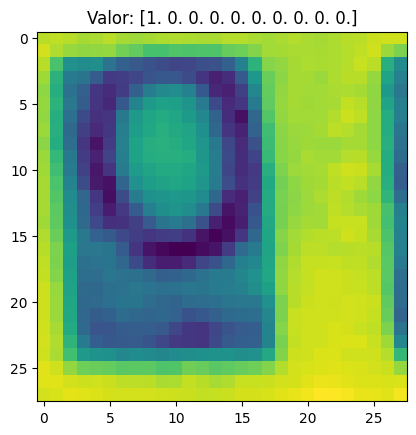

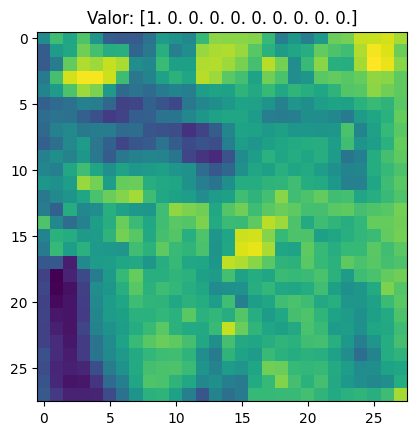

In [ ]:
import matplotlib.pyplot as plt

id = 89

plt.imshow(X_train[1000])
plt.title(f"Valor: {y_train[1000]}")
plt.show()

plt.imshow(X_test[id])
plt.title(f"Valor: {y_test[id]}")
plt.show()


plt.imshow(X_val[id])
plt.title(f"Valor: {y_val[id]}")
plt.show()


In [ ]:
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, LeakyReLU, Add, MaxPooling2D, GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.initializers import HeNormal

def residual_block(x, filters, kernel_size=3):
    shortcut = x
    if shortcut.shape[-1] != filters:
        shortcut = Conv2D(filters, (1,1), padding='same', kernel_initializer=HeNormal())(shortcut)
        shortcut = BatchNormalization()(shortcut)

    x = Conv2D(filters, kernel_size, padding='same', kernel_initializer=HeNormal())(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(alpha=0.1)(x)
    x = Conv2D(filters, kernel_size, padding='same', kernel_initializer=HeNormal())(x)
    x = BatchNormalization()(x)
    x = Add()([shortcut, x])
    x = LeakyReLU(alpha=0.1)(x)
    return x

input_layer = Input(shape=(28,28,1))

x = Conv2D(128, 3, padding='same', kernel_initializer=HeNormal())(input_layer)
x = BatchNormalization()(x)
x = LeakyReLU(alpha=0.1)(x)
x = MaxPooling2D()(x)

x = residual_block(x, 128)
x = MaxPooling2D()(x)

x = residual_block(x, 256)
x = MaxPooling2D()(x)





x = GlobalAveragePooling2D()(x)
x = Dense(256, kernel_initializer=HeNormal())(x)
x = BatchNormalization()(x)
x = LeakyReLU(alpha=0.1)(x)
#x = Dropout(0.2)(x)

output = Dense(10, activation='softmax')(x)

model = Model(inputs=input_layer, outputs=output)



/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


In [ ]:
from tensorflow.keras import metrics

METRICS = [
    metrics.AUC(name='auc', multi_label=True, num_labels=10),
    metrics.AUC(name='prc', curve='PR', multi_label=True, num_labels=10),
]


In [ ]:
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'] + METRICS)



In [ ]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 28, 28, 1) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 28, 28,    │      1,280 │ input_layer[0][0] │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 28, 28,    │        512 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu         │ (None, 28, 28,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 14, 14,    │          0 │ leaky_re_lu[0][0] │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 14, 14,    │    147,584 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 14, 14,    │        512 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_1       │ (None, 14, 14,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 14, 14,    │    147,584 │ leaky_re_lu_1[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 14, 14,    │        512 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 14, 14,    │          0 │ max_pooling2d[0]… │
│                     │ 128)              │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_2       │ (None, 14, 14,    │          0 │ add[0][0]         │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 7, 7, 128) │          0 │ leaky_re_lu_2[0]… │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 7, 7, 256) │    295,168 │ max_pooling2d_1[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 7, 7, 256) │      1,024 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_3       │ (None, 7, 7, 256) │          0 │ batch_normalizat… │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 7, 7, 256) │     33,024 │ max_pooling2d_1[… │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 1,288,714 (4.92 MB)

 Trainable params: 1,285,898 (4.91 MB)

 Non-trainable params: 2,816 (11.00 KB)

In [ ]:
datagen.fit(X_train)


In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

early_stopping = EarlyStopping(
    monitor='val_loss',      # Métrica para monitorar (loss de validação)
    patience=50,              # Quantas épocas esperar sem melhora antes de parar
    restore_best_weights=True  # Volta aos pesos da melhor época no final
)

In [ ]:
# Treinando o modelo usando o gerador de dados aumentados
history = model.fit(
    datagen.flow(X_train, y_train, batch_size=4),
    epochs=22,
    validation_data=(X_val, y_val),
    callbacks=[early_stopping]
)

Epoch 1/22


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1540/1540 ━━━━━━━━━━━━━━━━━━━━ 26s 10ms/step - accuracy: 0.2935 - auc: 0.7015 - loss: 2.0629 - prc: 0.2996 - val_accuracy: 0.6326 - val_auc: 0.9458 - val_loss: 1.1335 - val_prc: 0.8116
Epoch 2/22
1540/1540 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - accuracy: 0.6731 - auc: 0.9345 - loss: 1.0122 - prc: 0.7668 - val_accuracy: 0.8277 - val_auc: 0.9859 - val_loss: 0.5348 - val_prc: 0.9403
Epoch 3/22
1540/1540 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - accuracy: 0.7944 - auc: 0.9679 - loss: 0.6849 - prc: 0.8776 - val_accuracy: 0.8360 - val_auc: 0.9866 - val_loss: 0.5190 - val_prc: 0.9532
Epoch 4/22
1540/1540 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - accuracy: 0.8375 - auc: 0.9780 - loss: 0.5358 - prc: 0.9179 - val_accuracy: 0.8538 - val_auc: 0.9881 - val_loss: 0.4763 - val_prc: 0.9556
Epoch 5/22
1540/1540 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - accuracy: 0.8599 - auc: 0.9843 - loss: 0.4441 - prc: 0.9379 - val_accuracy: 0.9129 - val_auc: 0.9946 - val_loss: 0.2955 - val_prc: 0.9781
Epoch 6/22
1540/1540 ━━━━━━━━━━━━━━━━

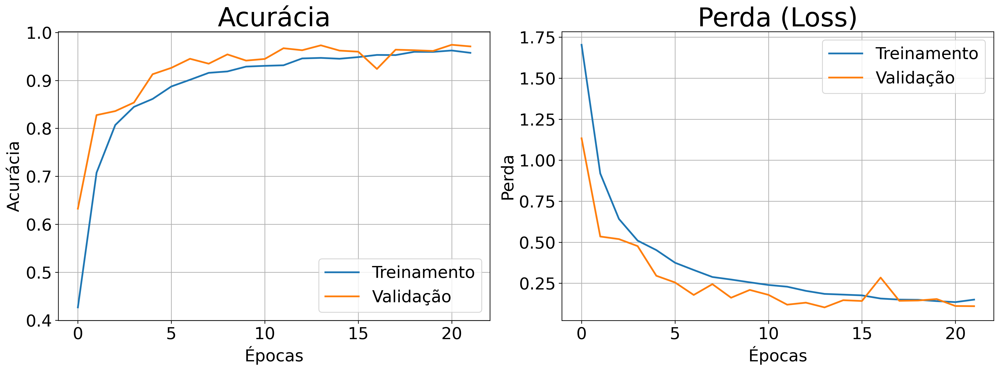

In [ ]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 2, figsize=(16, 6), dpi=300)

# Subplot 1: Accuracy
axs[0].plot(history.history['accuracy'], label='Treinamento', linewidth=2)
axs[0].plot(history.history['val_accuracy'], label='Validação', linewidth=2)
axs[0].set_title('Acurácia', fontsize=30)
axs[0].set_xlabel('Épocas', fontsize=19)
axs[0].set_ylabel('Acurácia', fontsize=19)
axs[0].tick_params(axis='both', labelsize=19)
axs[0].legend(fontsize=19)
axs[0].grid(True)

# Subplot 2: Loss
axs[1].plot(history.history['loss'], label='Treinamento', linewidth=2)
axs[1].plot(history.history['val_loss'], label='Validação', linewidth=2)
axs[1].set_title('Perda (Loss)', fontsize=30)
axs[1].set_xlabel('Épocas', fontsize=19)
axs[1].set_ylabel('Perda', fontsize=19)
axs[1].tick_params(axis='both', labelsize=19)
axs[1].legend(fontsize=19)
axs[1].grid(True)

plt.tight_layout()
plt.savefig("modelo_accuracy_loss.png", bbox_inches='tight')
plt.show()


In [ ]:
# Avalia o modelo e salva todas as métricas
results = model.evaluate(X_test, y_test, verbose=2)

# Obtém os nomes das métricas na mesma ordem dos resultados
for name, value in zip(model.metrics_names, results):
    print(f'{name}: {value:.4f}')


47/47 - 2s - 33ms/step - accuracy: 0.9787 - auc: 0.9982 - loss: 0.0894 - prc: 0.9936
loss: 0.0894
compile_metrics: 0.9787


In [ ]:
import numpy as np
import matplotlib.pyplot as plt


y_pred = model.predict(X_test)


num_images = 1500
cols = 5
rows = num_images // cols + int(num_images % cols != 0)

plt.figure(figsize=(15, 3 * rows))

for i in range(num_images):
    plt.subplot(rows, cols, i + 1)
    plt.imshow(X_test[i].reshape(28, 28), cmap='gray')
    plt.axis('off')
    plt.title(f'P: {np.argmax(y_pred[i])}\nR: {np.argmax(y_test[i])}', fontsize=9)

plt.tight_layout()
plt.show()


47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step


In [ ]:
import numpy as np
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt

# Supondo que y_pred, y_test, X_test já estão definidos no seu ambiente

y_true_labels = np.argmax(y_test, axis=1)
y_pred_labels = np.argmax(y_pred, axis=1)

correct_indices = np.where(y_true_labels == y_pred_labels)[0]
incorrect_indices = np.where(y_true_labels != y_pred_labels)[0]

selected_correct = np.random.choice(correct_indices, 6, replace=False)
selected_incorrect = np.random.choice(incorrect_indices, 2, replace=False)

selected_all = np.concatenate([selected_correct, selected_incorrect])

def np_to_pil(img_array):
    if img_array.max() <= 1.0:
        img_array = (img_array * 255).astype(np.uint8)
    else:
        img_array = img_array.astype(np.uint8)
    return Image.fromarray(img_array.reshape(28, 28))

try:
    font = ImageFont.truetype("arial.ttf", 14)
except:
    font = ImageFont.load_default()

def criar_imagem_dupla(idx1, idx2):
    img1 = np_to_pil(X_test[idx1])
    img2 = np_to_pil(X_test[idx2])
    largura = img1.width + img2.width
    altura = img1.height + 30

    nova_img = Image.new('L', (largura, altura), color=255)
    nova_img.paste(img1, (0, 30))
    nova_img.paste(img2, (img1.width, 30))

    draw = ImageDraw.Draw(nova_img)

    def text_size(text, font):
        bbox = draw.textbbox((0,0), text, font=font)
        return bbox[2] - bbox[0], bbox[3] - bbox[1]

    texto1 = f"P: {y_pred_labels[idx1]} | R: {y_true_labels[idx1]}"
    w1, h1 = text_size(texto1, font)
    draw.text(((img1.width - w1)//2, 5), texto1, fill=0, font=font)

    texto2 = f"P: {y_pred_labels[idx2]} | R: {y_true_labels[idx2]}"
    w2, h2 = text_size(texto2, font)
    draw.text((img1.width + (img2.width - w2)//2, 5), texto2, fill=0, font=font)

    return nova_img

fig, axs = plt.subplots(2, 2, figsize=(10, 8))

for i in range(4):
    idx1 = selected_all[2*i]
    idx2 = selected_all[2*i + 1]
    dupla_img = criar_imagem_dupla(idx1, idx2)

    ax = axs[i//2, i%2]
    ax.imshow(dupla_img, cmap='gray')
    ax.axis('off')

plt.tight_layout()
plt.show()


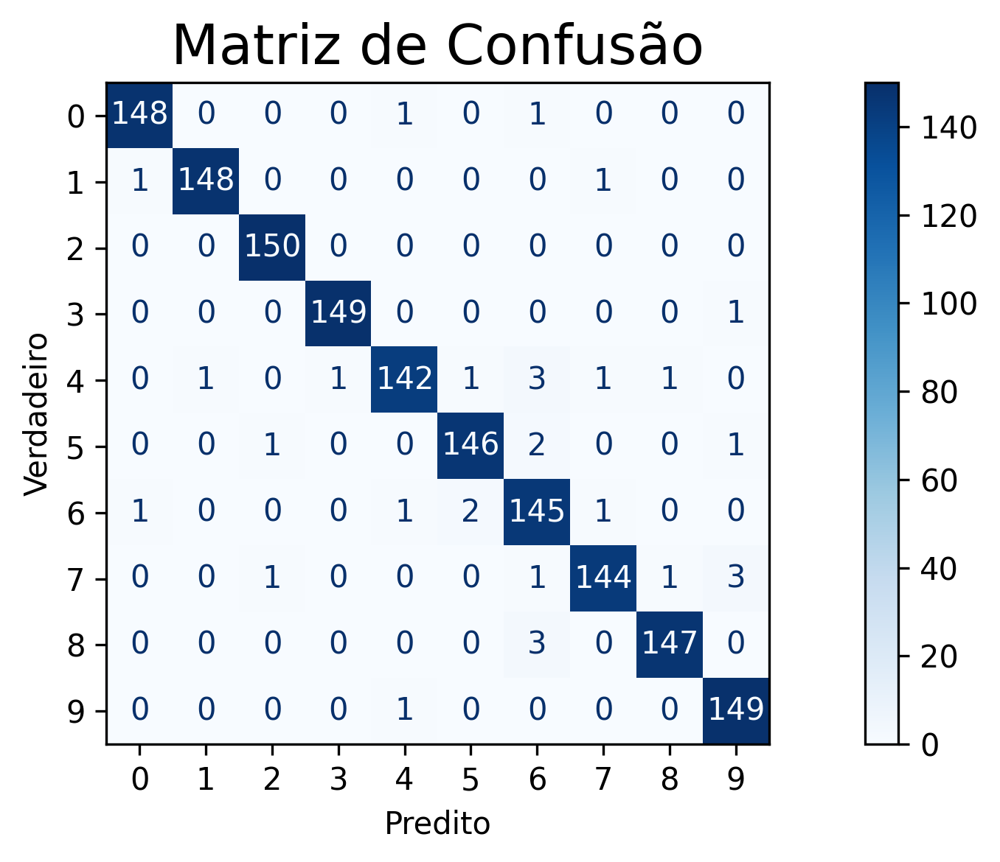

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import numpy as np
import matplotlib.pyplot as plt

# Convertemos y_test e y_pred para rótulos inteiros (classe)
y_true_labels = np.argmax(y_test, axis=1)
y_pred_labels = np.argmax(y_pred, axis=1)

# Gerar a matriz de confusão
cm = confusion_matrix(y_true_labels, y_pred_labels)

# Plot da matriz de confusão
plt.figure(figsize=(9, 4), dpi=300)  # tamanho maior e alta resolução

disp = ConfusionMatrixDisplay(confusion_matrix=cm)

# Para personalizar a plotagem com cmap e fontes maiores:
disp.plot(cmap=plt.cm.Blues, ax=plt.gca(), colorbar=True)

plt.title("Matriz de Confusão", fontsize=18)
plt.xlabel("Predito", fontsize=10)
plt.ylabel("Verdadeiro", fontsize=10)

# Ajusta os ticks para fonte maior
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

plt.tight_layout()
plt.savefig("matriz_confusao.png", bbox_inches='tight')  # salvar com alta qualidade
plt.show()


In [ ]:

model.save("classification_watermeters.h5")  # Salva em formato HDF5


In [ ]:
from google.colab import files
files.download("classification_watermeters.h5")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>